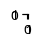

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150

sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder
import torch
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180
# Load models together
%load_ext autoreload
%autoreload 2
    
from src.torch_utils import load_model_full
from src.utils import get_class_initcode_keys
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.sim_utils import make_dist_matrix
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE, TwoStageVAECLF
from src.conv_models import CNNVAE, TwoStageCNNVAECLF
from src.metrics import reconstruction_accuracy, compute_cosine_distance
from src.cluster_utils import *
from src.networkx_utils import *

In [124]:
import numpy as np
from src.metrics import custom_silhouette_score
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

def weighted_silhouette_score(input_matrix, labels, metric='euclidean'):
    # Step 1: Compute the silhouette score for each sample
    all_scores = silhouette_samples(input_matrix, labels, metric=metric)

    # Step 2: Identify unique clusters and their sizes
    unique_labels, cluster_sizes = np.unique(labels, return_counts=True)

    # Step 3: Compute the weight for each cluster using log2(size) + 1
    cluster_weights = {label: size for label, size in zip(unique_labels, cluster_sizes)}

    # Step 4: Apply weights to each sample's silhouette score based on its cluster
    weighted_scores = np.array([all_scores[i] * cluster_weights[labels[i]] for i in range(len(labels))])

    # Step 5: Normalize the weighted scores by the total sum of weights
    total_weight = np.sum([cluster_weights[labels[i]] for i in range(len(labels))])

    # Step 6: Return the weighted silhouette score
    return np.sum(weighted_scores) / total_weight
# Step 1: Create a synthetic dataset with well-separated clusters
n_samples = 645
centers = [[1, 1], [5, 5], [9, 9], [1, 9], [9, 1]]  # Well-separated centers
cluster_std = [0.5, 0.7, 0.5, 0.6, 0.7]  # Controlled standard deviations (tight clusters)

X, labels = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, random_state=42)
print(silhouette_score(X, labels, metric='cosine'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='micro'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='macro'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='size_weighted'))
print(custom_silhouette_score(X, labels, metric='cosine', aggregation='size_log2'))
print(weighted_silhouette_score(X, labels, metric='cosine'))



0.2641186215618113
0.2641186215618113
0.2641186215618113
0.2641186215618114
0.2641186215618114
0.2641186215618113


# init

In [2]:
import csv
def get_metadata(filename):
    # Initialize a dictionary to hold the header information
    metadatares = {'filename':os.path.basename(filename)}
    metadatares['relpath']=filename
    # Read the CSV file
    with open(filename, mode='r') as file:
        reader = csv.reader(file)
        # Read the first line which contains the metadata
        metadata_line = next(reader)[0]
        # Convert the metadata line to a dictionary
        metadata = eval(metadata_line)
    metadatares.update(metadata)
    return metadatares
    
def read_ots_data(filename):
    metadata = get_metadata(filename)
    df = pd.read_csv(filename, skiprows=1)
    df = df[[c for c in df.columns if ('aa' in c.lower() and 'cdr' in c.lower()) or 'call' in c.lower()]]
    df.columns = [x.replace('cdr','').replace('_aa_','').replace('beta','B').replace('alpha','A')[::-1] if 'cdr' in x else x for x in df.columns]
    df.columns = df.columns.str.replace('_call','')
    df['Link']=metadata['Link']
    df['Disease']=metadata['Disease']
    df['CancerType']=metadata['CancerType']
    df['Source']=metadata['TSource']
    df['Subject']=metadata['Subject']
    return df, metadata


def plot_prune_heatmap(values, threshold, title, 
                       filename=None, outdir='../output/240618_NestedKCV_CNNVAE/notebook_figs/',
                       sorted_dm=None,
                       cmap='vlag', color='g', addline=True):
    # prune and plot the heatmap
    f,ax = plt.subplots(1,2, figsize=(16,16), width_ratios=(16.5/17, 0.5/17))
    ax = ax.ravel()
    ax, cbar_ax = ax[0], ax[1]
    pruned = values.copy()
    mask = (pruned<=threshold).astype(int)
    pruned = pruned * mask
    sns.heatmap(pruned, ax=ax, square=True, vmin=0, vmax=values.max(), cbar_ax=cbar_ax, cmap=cmap)
    # Set up custom tickmarks if available
    if sorted_dm is not None:
        pepmap = sorted_dm.groupby('peptide').agg(count=('raw_index','count'))
        pepmap['idx']=pepmap['count'].cumsum()
        pepmap['tick']=pepmap['idx']-pepmap['count'].iloc[0]+3
        tickmarks = pepmap['tick'].to_dict() 
        idxs = pepmap['idx'].to_dict()
        ax.set_xticks(list(tickmarks.values()))
        ax.set_yticks(list(tickmarks.values()))
        ax.set_xticklabels(list(tickmarks.keys()), ha='center', fontweight='semibold', fontsize=15)
        ax.set_yticklabels(list(tickmarks.keys()), va='center', fontweight='semibold', fontsize=15)
    if addline and sorted_dm is not None:
        for k,v in idxs.items():
            ax.axhline(v, ls='--', lw=.9, c=color)
            ax.axvline(v, ls='--', lw=.9, c=color)
    # Rotate the tick labels for better readability (optional)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    ax.set_title(title, fontweight='semibold', fontsize=17)
    f.tight_layout()
    if filename is not None:
        f.savefig(f'{outdir}{filename}.png', dpi=150, bbox_inches='tight')
    plt.close()
    del f, ax

def do_all(filename, model, noplot=False, unique=False, outdir='../output/240820_HumanRepertoires/'):
    df, metadata = read_ots_data(filename)
    df['tcr'] = df[['A1','A2','A3','B1','B2','B3']].sum(axis=1)
    if unique:
        df.drop_duplicates(subset=['tcr'], inplace=True)
    metadata['n_seq'] = len(df)
    metadata['n_unique'] = len(df['tcr'].unique())
    pd.DataFrame(metadata, index=[0]).to_csv(f"{outdir}metadata/{metadata['Run']}_metadata.txt", index=False)
    if noplot:
        return 0
    else:
            
        if len(glob.glob(f'{outdir}heatmaps/*{metadata["Run"]}*'))>0:
            return 0
    
        latent_df = get_latent_df(model, df)
        latent_df['index_col'] = [f'seq_{i:04}' for i in range(len(latent_df))]
        _, values_array, _, _, _, _ = get_distances_labels_from_latent(latent_df, 
                                                                       label_col='Disease', 
                                                                       index_col='index_col',
                                                                       rest_cols=['Disease','CancerType','Source'],
                                                                       low_memory=True)
        
        latent_df['tcr'] = latent_df[['A1','A2','A3','B1','B2','B3']].sum(axis=1)
        n_seq=len(latent_df)
        n_unique=len(latent_df['tcr'].unique())
        plot_prune_heatmap(values_array, threshold=10, title=f"{metadata['Run']}, n_seq={n_seq}, n_unique={n_unique}", 
                           filename=f'{metadata["Run"]}_n-{n_seq}_unique-{n_unique}',
                           outdir=f'{outdir}heatmaps/', addline=False, sorted_dm=None)
        print(metadata['Run'], '\t', n_seq, '\t', n_unique)
        del latent_df
    # latent_df.groupby(['tcr']).agg(count=('B1','count')).sort_values('count',ascending=False)

In [3]:
def read_ots_unique(filename):
    df, metadata = read_ots_data(filename)
    df['tcr'] = df[['A1','A2','A3','B1','B2','B3']].sum(axis=1)
    metadata['n_seq'] = len(df)
    metadata['unique'] = len(df.tcr.unique())
    counts = df.groupby('tcr').agg(count=('B3','count'))
    df = df.drop_duplicates(subset=['tcr'])
    df = df.set_index('tcr').merge(counts,left_index=True,right_index=True).reset_index()
    df['Run']=metadata['Run']
    return df, metadata

In [3]:
meta_df = pd.read_csv('../data/OTS/human/METADATA.txt')
meta_df.groupby(['Link','Author']).agg(disease=('Disease','unique'),
                                      n_repertoires=('Disease','count'),
                                      mean_size=('Sequences', 'mean'),
                                      mean_unique=('n_unique','mean'))

,,disease,n_repertoires,mean_size,mean_unique
Link,Author,,,,
https://pubmed.ncbi.nlm.nih.gov/33478949/,Kusnadi et al. 2021,[covid],15,4657.133333,734.266667
https://pubmed.ncbi.nlm.nih.gov/34156975/,"Peng et al., 2021",[herpes_simplex_virus_type_2],4,1324.250000,681.250000
https://pubmed.ncbi.nlm.nih.gov/34793243/,Francis et al. 2021,[covid],95,1655.589474,821.357895
https://pubmed.ncbi.nlm.nih.gov/36516854/,Yu et al. 2022,[cmv],6,2545.833333,733.500000
https://pubmed.ncbi.nlm.nih.gov/37580605/,Garner et al.,[healthy],96,5587.364583,1663.104167
https://www.nature.com/articles/s41590-022-01367-z,Xu et al. 2023,[covid],8,4370.750000,3346.875000
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10201342/,Eberhardt et al. 2021,[cancer],51,1234.333333,191.705882


In [144]:
exp_df = pd.read_csv('../data/filtered/240326_nettcr_paired_NOswaps.csv')
top17 = exp_df.query('partition==1').groupby('peptide').agg(count=('B3','count')).query('count>=20').index
top8 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'TTDPSFLGRY', 'SPRWYFYYL', 'KLGGALQAK', 'AVFDRKSDAK']
top5 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL', 'LLWNGPMAV']
top4 = ['ELAGIGILTV', 'RAKFKQLL', 'GILGFVFTL', 'YLQPRTFLL']
top3 = ['ELAGIGILTV', 'GILGFVFTL', 'RAKFKQLL']

test_df = exp_df.query('partition==1').sort_values('peptide')
test_17 = test_df.query('peptide in @top17')
test_3 = test_df.query('peptide in @top3')
test_4 = test_df.query('peptide in @top4')
test_5 = test_df.query('peptide in @top5')
test_8 = test_df.query('peptide in @top8')
ts_cstrp = load_model_full('epoch_4500_interval_checkpoint__kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd.pt',
                           'checkpoint_best_kcv_fold_00_Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd_JSON_kwargs.json',
                           dir_path='../output/240618_NestedKCV_CNNVAE/Nested_TwoStageCNNVAE_latent_128_kld_1e-2_ExpData_BLOSUM_PEP_KFold_0_240910_1436_jyGpd/')

<class 'torch.nn.modules.batchnorm.BatchNorm1d'> 128 9 4 2 1 0 SELU()
No GPUs available. Using CPU.
Reloading best model:
epoch: 4500
total: 0.28910083712824164
reconstruction: 0.05983970926761729
kld: 0.0
triplet: 0.0
BCE: 0.22926112741663837
seq_accuracy: 0.9946567416191101
pos_accuracy: 0.9978268146514893
auc: 0.73856
auc_01: 0.57302
auc_01_real: 0.18874
precision: 0.40048
recall: 0.42172
accuracy: 0.79778
AP: 0.34001


In [6]:
dm_tbcr_test = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv').query('partition==1')
# dm_tbcr_2pep, da_tbcr_2pep = resort_baseline(dm_tbcr_test, dm_2pep, 'raw_index')
# dm_tbcr_3pep, da_tbcr_3pep = resort_baseline(dm_tbcr_test, dm_3pep, 'raw_index')

# Extra extra experiments

In [7]:
def cut_logsize_pipe(model, df, dm=None, label_col='peptide', index_col='raw_index',
                     initial_cut_threshold=150, distance_weighted=True):
    if dm is None:
        latent = get_latent_df(model, df)
        dm, da, feats, labs, enc_labs, lab_enc = get_distances_labels_from_latent(latent, index_col=index_col)
        
    G, original_tree, dist_matrix, values_array, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(
            dm, label_col=label_col, index_col=index_col, weight_col=None, algorithm='kruskal')
    
    best_tree, subgraphs, macro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_macro \
    = iterative_topn_cut_logsize(
            values_array, original_tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top',
            top_n=1, which='edge', distance_weighted=distance_weighted, verbose=0, score_threshold=.75, silhouette_aggregation='macro')
    macro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster']).assign(silhouette_aggregate='macro')
    print(best_nodes_removed)
    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro \
    = iterative_topn_cut_logsize(
            values_array, original_tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top',
            top_n=1, which='edge', distance_weighted=distance_weighted, verbose=0, score_threshold=.75, silhouette_aggregation='micro')
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster']).assign(silhouette_aggregate='micro')

    return pd.concat([micro_cut_df, macro_cut_df]), macro_clusters, micro_clusters, cluster_sizes_macro, cluster_sizes_micro
     

In [8]:
def get_nodes_cut(model, df, dm=None, label_col='peptide', index_col='raw_index',
                     initial_cut_threshold=150, distance_weighted=True):
    if dm is None:
        latent = get_latent_df(model, df)
        dm, da, feats, labs, enc_labs, lab_enc = get_distances_labels_from_latent(latent, index_col=index_col)
    # graph
    G, original_tree, dist_matrix, values_array, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(
            dm, label_col=label_col, index_col=index_col, weight_col=None, algorithm='kruskal')
    # clustering 
    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro \
    = iterative_topn_cut_logsize(
            values_array, original_tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top',
            top_n=1, which='edge', distance_weighted=distance_weighted, verbose=0, score_threshold=.75, silhouette_aggregation='micro')
    # df results
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster']).assign(silhouette_aggregate='micro')
    singletons = labels[best_nodes_removed]
    return micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df
     

## Redo noisy matrix: do 5 labels

In [9]:
def in_silico_cuts(matrix, initial_cut_threshold=1, distance_weighted=True, silhouette_aggregation='micro'):
    G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(matrix, label_col='peptide', index_col='raw_index', algorithm='kruskal')

    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro \
        = iterative_topn_cut_logsize(values, tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top',
                                     top_n=1, which='edge', distance_weighted=distance_weighted, verbose=0, score_threshold=1, silhouette_aggregation='micro')
    # df results
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster'])#.assign(silhouette_aggregate='micro')
    singletons = labels[best_nodes_removed]
    
    return micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df

def in_silico_agglo(matrix, n_points=500, silhouette_aggregation='micro', n_jobs=8):
    values = matrix.iloc[:len(matrix), :len(matrix)].values
    features = values.copy()
    labels = matrix['peptide'].values
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    return cluster_all_thresholds(values, values, labels, encoded_labels, label_encoder, 5, n_points, silhouette_aggregation, n_jobs)

### Making synthetic matrices

In [12]:
import copy
# Do 400 datapoints and 5 classes with slightly different sizes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
# Perf matrix is a binary matrix
perf_values = np.ones((400, 400))
# Noisy matrix simulates a distance matrix
noisy_values = np.ones((400, 400)) * np.random.uniform(low=0.9, high=1.25, size=(400,400))

for label in range(5):
    idxs = np.where(fake_labels==label)[0]
    size = idxs[-1]-idxs[0] +1
    perf_values[idxs[0]:idxs[-1]+1, idxs[0]:idxs[-1]+1] = 0.05
    noisy_values[idxs[0]:idxs[-1]+1, idxs[0]:idxs[-1]+1] = np.clip(np.random.normal(0.125, 0.1, size =(size,size)), 0.02575, 1)
    noisy_values = np.clip(noisy_values, 0,1)

a,b = np.where(perf_values!=0.05)
noisy_values[a, b] = np.clip(np.random.normal(0.6, 0.4, size=noisy_values[a,b].shape), 0.175, 1)
noisy_values = np.clip(noisy_values, a_min=-1.5, a_max=1.5)
noisy_values = (noisy_values * (1-np.eye(400,400))).round(4)

# Create one more matrix which is "kinda" connected between the classes
noisier_values = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
noisier_values[a, b] = np.clip(np.random.normal(0.2, 0.175, size=noisier_values[a,b].shape), 0.08, 1)
noisier_values = np.clip(noisier_values, a_min=-1.5, a_max=1.5)
noisier_values = (noisier_values * (1-np.eye(400,400))).round(4)

# Create one more matrix which is more connected between the classes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
noisier_values_2 = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
noisier_values_2[a, b] = np.clip(np.random.normal(0.15, 0.15, size=noisier_values_2[a,b].shape), 0.065, 1)
noisier_values_2 = np.clip(noisier_values_2, a_min=-1.5, a_max=1.5)
noisier_values_2 = (noisier_values_2 * (1-np.eye(400,400))).round(4)


# Create one more matrix which is even more connected between the classes
fake_labels = np.array([0]*75+[1]*60+[2]*70+[3]*115+[4]*80)
noisier_values_3 = copy.deepcopy(noisy_values)
# Use the perfect matrix as an indexing mask
a,b = np.where(perf_values!=0.05)
noisier_values_3[a, b] = np.clip(np.random.normal(0.1, 0.15, size=noisier_values_3[a,b].shape), 0.05, 1)
noisier_values_3 = np.clip(noisier_values_3, a_min=-1.5, a_max=1.5)
noisier_values_3 = (noisier_values_3* (1-np.eye(400,400))).round(4)
# Make triangle symetrical
noisy_values = np.triu(noisy_values) + np.triu(noisy_values, k=1).T
noisier_values = np.triu(noisier_values) + np.triu(noisier_values, k=1).T
noisier_values_2 = np.triu(noisier_values_2) + np.triu(noisier_values_2, k=1).T
noisier_values_3 = np.triu(noisier_values_3) + np.triu(noisier_values_3, k=1).T
perf_values = np.triu(perf_values) + np.triu(perf_values, k=1).T
np.fill_diagonal(noisy_values, 0)
np.fill_diagonal(noisier_values, 0)
np.fill_diagonal(noisier_values_2, 0)
np.fill_diagonal(noisier_values_3, 0)
np.fill_diagonal(perf_values, 0)

In [13]:
np.array_equal(noisier_values_3, noisier_values_3.T)

True

### results

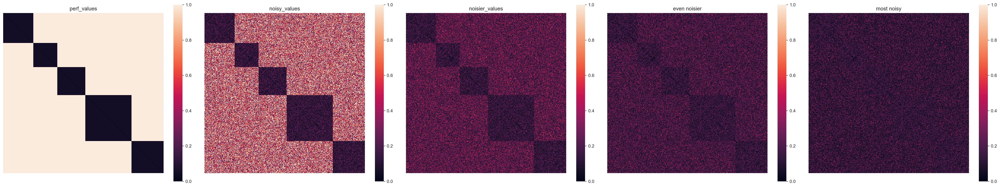

In [14]:
# Creating pandas dataframes
mapping = {k:v for k,v in zip(range(5), ['pep_a', 'pep_b', 'pep_c', 'pep_d', 'pep_e'])}
columns = [f'{mapping[x]}_{i}' for i,x in enumerate(fake_labels)]
noisy_matrix = pd.DataFrame(noisy_values, columns = columns, index=columns)
noisy_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisy_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisy_matrix))]
perf_matrix = pd.DataFrame(perf_values, columns = columns, index=columns)
perf_matrix['peptide'] = [mapping[x] for x in fake_labels]
perf_matrix['raw_index'] = [f'seq_{i}' for i in range(len(perf_matrix))]
noisier_matrix = pd.DataFrame(noisier_values, columns = columns, index=columns)
noisier_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_matrix))]
noisier_2_matrix = pd.DataFrame(noisier_values_2, columns = columns, index=columns)
noisier_2_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_2_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_2_matrix))]
noisier_3_matrix = pd.DataFrame(noisier_values_3, columns = columns, index=columns)
noisier_3_matrix['peptide'] = [mapping[x] for x in fake_labels]
noisier_3_matrix['raw_index'] = [f'seq_{i}' for i in range(len(noisier_3_matrix))]
# Quick plot to check 
f,ax=plt.subplots(1,5, figsize=(32,6))
ax = ax.ravel()
sns.heatmap(perf_values,ax=ax[0],  square=True, xticklabels=False, yticklabels=False)
ax[0].set_title('perf_values');
sns.heatmap(noisy_values, ax=ax[1], square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False)
ax[1].set_title('noisy_values');
sns.heatmap(noisier_values, ax=ax[2], square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False)
ax[2].set_title('noisier_values');
sns.heatmap(noisier_values_2, ax=ax[3], square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False)
ax[3].set_title('even noisier');
sns.heatmap(noisier_values_3, ax=ax[4], square=True, vmax=1, vmin=0, xticklabels=False, yticklabels=False)
ax[4].set_title('most noisy');
f.tight_layout()
f.savefig('../../../writing/VAE_TCR_DRAFT/noisy_matrices.png', dpi=300, bbox_inches='tight')

In [15]:
# perf_matrix, noisy_matrix, noisier_matrix, noisier_2_matrix
perf_clusters, perf_nodes, perf_subgraphs, perf_tree, perf_labels, perf_singletons, perf_cut_df = in_silico_cuts(perf_matrix)
noisy_clusters, noisy_nodes, noisy_subgraphs, noisy_tree, noisy_labels, perf_singletons, noisy_cut_df = in_silico_cuts(noisy_matrix)
noisier_clusters, noisier_nodes, noisier_subgraphs, noisier_tree, noisier_labels, perf_singletons, noisier_cut_df = in_silico_cuts(noisier_matrix)
noisier_2_clusters, noisier_2_nodes, noisier_2_subgraphs, noisier_2_tree, noisier_2_labels, noisier_2_singletons, noisier_2_cut_df = in_silico_cuts(noisier_2_matrix)
noisier_3_clusters, noisier_3_nodes, noisier_3_subgraphs, noisier_3_tree, noisier_3_labels, noisier_3_singletons, noisier_3_cut_df = in_silico_cuts(noisier_3_matrix)
noisier_3_clusters_nodist, noisier_3_nodes_nodist, noisier_3_subgraphs_nodist, noisier_3_tree_nodist, noisier_3_labels_nodist, noisier_3_singletons_nodist, noisier_3_cut_df_nodist = in_silico_cuts(noisier_3_matrix, distance_weighted=False)

perf_agglo_df = in_silico_agglo(perf_matrix)
noisy_agglo_df = in_silico_agglo(noisy_matrix)
noisier_agglo_df = in_silico_agglo(noisier_matrix)
noisier_2_agglo_df = in_silico_agglo(noisier_2_matrix)
noisier_3_agglo_df = in_silico_agglo(noisier_3_matrix)

Initial mean purity, silhouette score, retention
0.6404 0.4424 1.0
Initial mean purity, silhouette score, retention
0.6404 0.3621 1.0
Initial mean purity, silhouette score, retention
0.6404 0.1881 1.0
Initial mean purity, silhouette score, retention
0.6404 0.1111 1.0
Initial mean purity, silhouette score, retention
0.6404 0.0193 1.0
Initial mean purity, silhouette score, retention
0.6404 0.0193 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [16]:
pd.concat([perf_cut_df.loc[[perf_cut_df['silhouette'].idxmax()]].assign(matrix='perf', method='cut'),
perf_agglo_df.loc[[perf_agglo_df['silhouette'].idxmax()]].assign(matrix='perf', method='agglo'),
noisy_cut_df.loc[[noisy_cut_df['silhouette'].idxmax()]].assign(matrix='noisy', method='cut'),
noisy_agglo_df.loc[[noisy_agglo_df['silhouette'].idxmax()]].assign(matrix='noisy', method='agglo'),
noisier_cut_df.loc[[noisier_cut_df['silhouette'].idxmax()]].assign(matrix='noisier', method='cut'),
noisier_agglo_df.loc[[noisier_agglo_df['silhouette'].idxmax()]].assign(matrix='noisier', method='agglo'),
noisier_2_cut_df.loc[[noisier_2_cut_df['silhouette'].idxmax()]].assign(matrix='even_noisier', method='cut'),
noisier_2_agglo_df.loc[[noisier_2_agglo_df['silhouette'].idxmax()]].assign(matrix='even_noisier', method='agglo'),
noisier_3_cut_df.loc[[noisier_3_cut_df['silhouette'].idxmax()]].assign(matrix='most_noisy', method='cut'),
noisier_3_cut_df_nodist.loc[[noisier_3_cut_df_nodist['silhouette'].idxmax()]].assign(matrix='most_noisy', method='cut_nodistweighted'),
noisier_3_agglo_df.loc[[noisier_3_agglo_df['silhouette'].idxmax()]].assign(matrix='most_noisy', method='agglo')])[['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'matrix','method']]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,matrix,method
3,0.950000,1.000000,1.0000,80.000000,5.0,perf,cut
1,0.950000,1.000000,1.0000,80.000000,5.0,perf,agglo
3,0.762600,1.000000,1.0000,80.000000,5.0,noisy,cut
274,0.762553,1.000000,1.0000,80.000000,5.0,noisy,agglo
3,0.364700,1.000000,1.0000,80.000000,5.0,noisier,cut
25,0.194475,1.000000,0.9925,2.544872,156.0,noisier,agglo
3,0.185700,1.000000,1.0000,80.000000,5.0,even_noisier,cut
27,0.202882,0.936364,1.0000,2.797203,143.0,even_noisier,agglo
0,0.019300,0.640351,1.0000,200.000000,2.0,most_noisy,cut
0,0.019300,0.640351,1.0000,200.000000,2.0,most_noisy,cut_nodistweighted


## Redo this with 2-3 peps set-up

In [69]:
test_df = exp_df.query('partition==1')
# Equal sampling per class
test_2pep = test_df.query('peptide in ["GILGFVFTL", "RAKFKQLL"]').groupby('peptide').sample(n=150, random_state=13).drop_duplicates(subset=['raw_index'])
test_3pep = test_df.query('peptide in ["GILGFVFTL", "RAKFKQLL", "YLQPRTFLL"]').groupby('peptide').sample(n=80, random_state=13).drop_duplicates(subset=['raw_index'])
# Peptide sorted
latent_2pep = get_latent_df(ts_cstrp, test_2pep).sort_values('peptide')
latent_3pep = get_latent_df(ts_cstrp, test_3pep).sort_values('peptide')
# Get dm da etc
dm_2pep, da_2pep, feats_2pep, labels_2pep, encoded_labels_2pep, label_encoder_2pep = get_distances_labels_from_latent(latent_2pep, index_col='raw_index')
dm_3pep, da_3pep, feats_3pep, labels_3pep, encoded_labels_3pep, label_encoder_3pep = get_distances_labels_from_latent(latent_3pep, index_col='raw_index')

In [70]:
len(np.unique(dm_2pep.index)), len(dm_2pep), len(dm_2pep.columns)

(300, 300, 306)

In [71]:
# not sure why the duplication happened here
dm_2pep = dm_2pep[dm_2pep.index.to_list()+['peptide','binder','raw_index','partition']]
dm_3pep = dm_3pep[dm_3pep.index.to_list()+['peptide','binder','raw_index','partition']]

In [72]:
dm_tbcr_test = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv').query('partition==1')
dm_tbcr_2pep, da_tbcr_2pep = resort_baseline(dm_tbcr_test, dm_2pep, 'raw_index')
dm_tbcr_3pep, da_tbcr_3pep = resort_baseline(dm_tbcr_test, dm_3pep, 'raw_index')

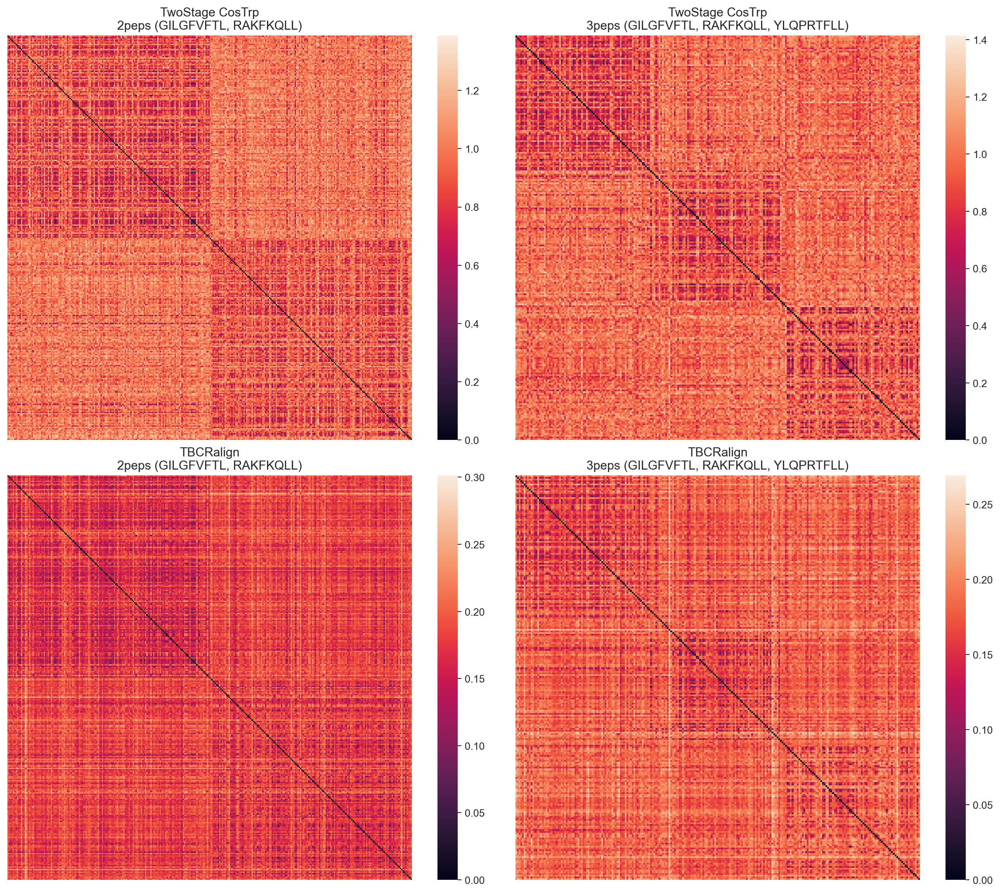

In [73]:
fig, ax = plt.subplots(2,2, figsize=(14,12))
ax=ax.ravel()
sns.heatmap(da_2pep, square=True, xticklabels=False, yticklabels=False, ax=ax[0])
sns.heatmap(da_3pep, square=True, xticklabels=False, yticklabels=False, ax=ax[1])
sns.heatmap(da_tbcr_2pep, square=True, xticklabels=False, yticklabels=False, ax=ax[0+2])
sns.heatmap(da_tbcr_3pep, square=True, xticklabels=False, yticklabels=False, ax=ax[1+2])
ax[0].set_title('TwoStage CosTrp\n2peps (GILGFVFTL, RAKFKQLL)')
ax[1].set_title('TwoStage CosTrp\n3peps (GILGFVFTL, RAKFKQLL, YLQPRTFLL)')
ax[0+2].set_title('TBCRalign\n2peps (GILGFVFTL, RAKFKQLL)')
ax[1+2].set_title('TBCRalign\n3peps (GILGFVFTL, RAKFKQLL, YLQPRTFLL)')
fig.tight_layout(h_pad=1,w_pad=1)

In [74]:
cols=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'matrix', 'method']

### 2 peps set-up (GIL and RAK)

In [75]:
# VAE
gilrak_clusters, gilrak_nodes, gilrak_subgraphs, gilrak_tree, gilrak_labels, gilrak_singletons, gilrak_cut_df = in_silico_cuts(dm_2pep)
gilrak_agglo_df = in_silico_agglo(dm_2pep)

gilrak_clusters, gilrak_nodes, gilrak_subgraphs, gilrak_tree, gilrak_labels, gilrak_singletons, gilrak_cut_df_tbcr = in_silico_cuts(dm_tbcr_2pep)
gilrak_agglo_df_tbcr = in_silico_agglo(dm_tbcr_2pep)

pd.concat([gilrak_cut_df.loc[[gilrak_cut_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='cut'),
           gilrak_agglo_df.loc[[gilrak_agglo_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='agglo'),
           gilrak_cut_df_tbcr.loc[[gilrak_cut_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='cut'),
           gilrak_agglo_df_tbcr.loc[[gilrak_agglo_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='agglo')])[cols]

Initial mean purity, silhouette score, retention
0.7946 0.0962 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6301 0.057 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,matrix,method
149,0.145100,0.905449,0.843300,2.432692,104.0,TwoStageCosTrp,cut
237,0.149000,0.870576,0.853333,3.160494,81.0,TwoStageCosTrp,agglo
166,0.104300,0.934028,0.760000,2.375000,96.0,TBCR,cut
237,0.136541,0.894444,0.836667,4.114754,61.0,TBCR,agglo


### 3 peps set-up (GIL, RAK, YLQ)

In [76]:
# VAE
pep3_clusters, pep3_nodes, pep3_subgraphs, pep3_tree, pep3_labels, pep3_singletons, pep3_cut_df = in_silico_cuts(dm_3pep)
pep3_agglo_df = in_silico_agglo(dm_3pep)

pep3_clusters, pep3_nodes, pep3_subgraphs, pep3_tree, pep3_labels, pep3_singletons, pep3_cut_df_tbcr = in_silico_cuts(dm_tbcr_3pep)
pep3_agglo_df_tbcr = in_silico_agglo(dm_tbcr_3pep)

pd.concat([pep3_cut_df.loc[[pep3_cut_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='cut'),
           pep3_agglo_df.loc[[pep3_agglo_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='agglo'),
           pep3_cut_df_tbcr.loc[[pep3_cut_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='cut'),
           pep3_agglo_df_tbcr.loc[[pep3_agglo_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='agglo')])[cols]

Initial mean purity, silhouette score, retention
0.595 0.0622 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.4732 0.0367 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,matrix,method
132,0.150300,0.869478,0.787500,2.277108,83.0,TwoStageCosTrp,cut
274,0.170611,0.761376,0.945833,3.603175,63.0,TwoStageCosTrp,agglo
133,0.108200,0.846491,0.754200,2.381579,76.0,TBCR,cut
288,0.140215,0.763943,0.916667,4.313725,51.0,TBCR,agglo


## Redo 2-3 peps set-up but with cleaning the data

### clean

In [77]:
def get_dist(row, dm):
    # print(row.name)
    wtf=dm.loc[row.name]
    label = wtf['peptide']
    idx = wtf['raw_index']
    # intra part
    indices = dm.query('peptide==@label and raw_index!=@idx').index
    intra_values = row[indices].values
    intra_mean_val = intra_values.mean()
    intra_max_val = intra_values.max()
    intra_med_val = np.median(intra_values)
    # inter part
    indices = dm.query('peptide!=@label and raw_index!=@idx').index
    inter_values = row[indices].values
    inter_mean_val = inter_values.mean()
    inter_max_val = inter_values.max()
    inter_med_val = np.median(inter_values)
    return intra_mean_val, intra_max_val, intra_med_val, inter_mean_val, inter_max_val, inter_med_val

def clean_dm(dm, intra=0.9, inter=0.9):
    dm[['intra_mean_val', 'intra_max_val', 'intra_med_val', 'inter_mean_val', 'inter_max_val', 'inter_med_val']] = dm.apply(lambda x: get_dist(x, dm), result_type='expand', axis=1)
    dm['mean_flag'] = dm.apply(lambda x: x['intra_mean_val']>x['inter_mean_val'], axis=1)
    dm['max_flag'] = dm.apply(lambda x: x['intra_max_val']>x['inter_max_val'], axis=1)
    dm['med_flag'] = dm.apply(lambda x: x['intra_med_val']>x['inter_med_val'], axis=1)
    dm['intra_flag'] = dm['intra_mean_val'].apply(lambda x: x>intra)
    dm['inter_flag'] = dm['inter_mean_val'].apply(lambda x: x<=inter)
    cleaned = dm.query('not (mean_flag or max_flag or med_flag or intra_flag or inter_flag)')
    return cleaned[list(cleaned.index)+['peptide','raw_index','partition','binder']]


Text(0.5, 1.0, '')

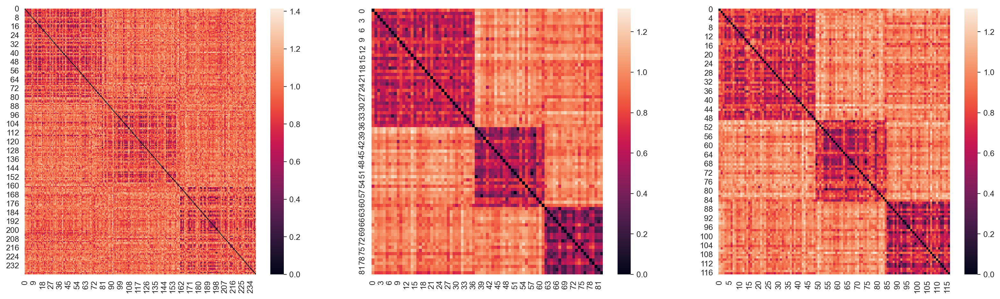

In [78]:
f,ax = plt.subplots(1,3,figsize=(22,6))
xd = clean_dm(dm_3pep, .9, .9)
xd2 = clean_dm(dm_3pep, .85, .85)
sns.heatmap(dm_3pep.iloc[:len(dm_3pep), :len(dm_3pep)].values,ax=ax[0])
sns.heatmap(xd2.iloc[:len(xd2), :len(xd2)].values, ax=ax[1])
sns.heatmap(xd.iloc[:len(xd), :len(xd)].values, ax=ax[2])
ax[0].set_title('')
ax[1].set_title('')
ax[2].set_title('')

<Axes: >

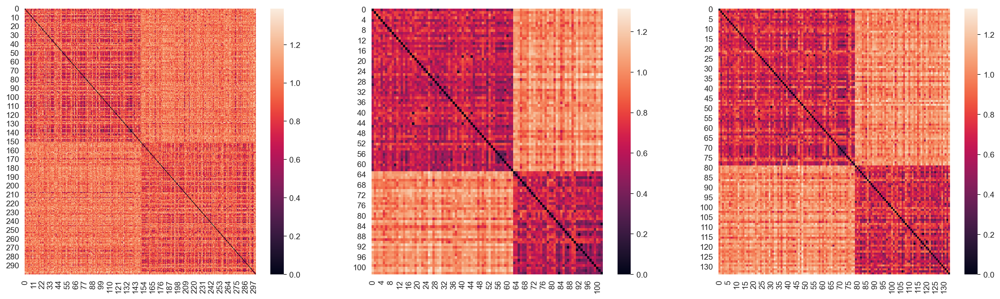

In [80]:
f,ax = plt.subplots(1,3,figsize=(22,6))
xd = clean_dm(dm_2pep, .9, .9)
xd2 = clean_dm(dm_2pep, .85, .85)
sns.heatmap(da_2pep,ax=ax[0])
sns.heatmap(xd2.iloc[:len(xd2), :len(xd2)].values, ax=ax[1])
sns.heatmap(xd.iloc[:len(xd), :len(xd)].values, ax=ax[2])

In [81]:
def get_all_from_dm(dm, label_col='peptide', index_col='raw_index'):
    da = dm.iloc[:len(dm),:len(dm)]
    labels = dm[label_col].values
    index_col = dm[index_col].values
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    # return da twice for "features"
    return dm, da, da, labels, encoded_labels, label_encoder

In [82]:
test_df = exp_df.query('partition==1')
# Equal sampling per class
test_2pep = test_df.query('peptide in ["GILGFVFTL", "RAKFKQLL"]').groupby('peptide').sample(n=150, random_state=13)
test_3pep = test_df.query('peptide in ["GILGFVFTL", "RAKFKQLL", "YLQPRTFLL"]').groupby('peptide').sample(n=80, random_state=13)
# Peptide sorted
latent_2pep = get_latent_df(ts_cstrp, test_2pep).sort_values('peptide')
latent_3pep = get_latent_df(ts_cstrp, test_3pep).sort_values('peptide')
# Get dm da etc
dm_2pep, da_2pep, feats_2pep, labels_2pep, encoded_labels_2pep, label_encoder_2pep = get_distances_labels_from_latent(latent_2pep, index_col='raw_index')
dm_3pep, da_3pep, feats_3pep, labels_3pep, encoded_labels_3pep, label_encoder_3pep = get_distances_labels_from_latent(latent_3pep, index_col='raw_index')

In [83]:
cleaned_2pep = clean_dm(dm_2pep, .9)
cleaned_3pep = clean_dm(dm_3pep, .85)
dm_2pep, da_2pep, feats_2pep, labels_2pep, encoded_labels_2pep, label_encoder_2pep = get_all_from_dm(cleaned_2pep, index_col='raw_index')
dm_3pep, da_3pep, feats_3pep, labels_3pep, encoded_labels_3pep, label_encoder_3pep = get_all_from_dm(cleaned_3pep, index_col='raw_index')
dm_tbcr_2pep, da_tbcr_2pep = resort_baseline(dm_tbcr_test, dm_2pep, 'raw_index')
dm_tbcr_3pep, da_tbcr_3pep = resort_baseline(dm_tbcr_test, dm_3pep, 'raw_index')

<Axes: >

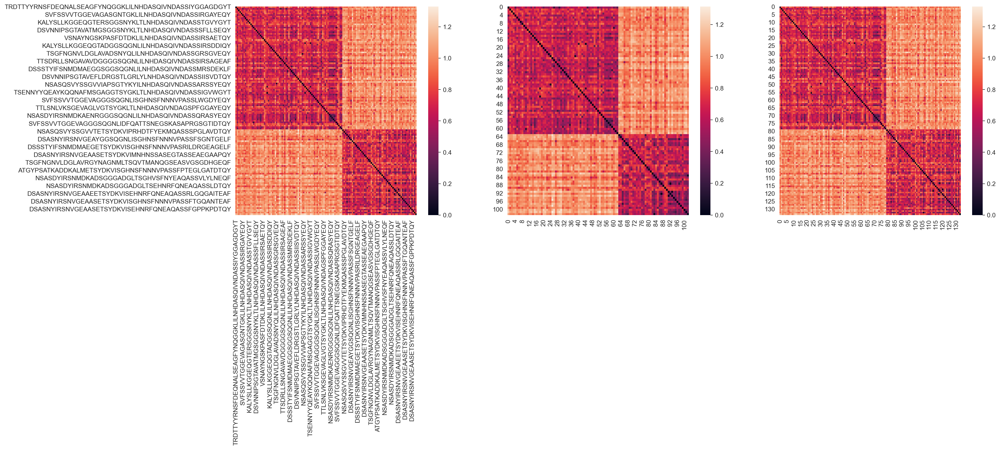

In [84]:
f,ax = plt.subplots(1,3,figsize=(22,6))

sns.heatmap(dm_2pep.iloc[:len(dm_2pep), :len(dm_2pep)] ,ax=ax[0])
sns.heatmap(xd2.iloc[:len(xd2), :len(xd2)].values, ax=ax[1])
sns.heatmap(xd.iloc[:len(xd), :len(xd)].values, ax=ax[2])

In [85]:
cols=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'matrix', 'method']

### do .9 for 2peps

In [86]:
# VAE
gilrak_clusters, gilrak_nodes, gilrak_subgraphs, gilrak_tree, gilrak_labels, gilrak_singletons, gilrak_cut_df = in_silico_cuts(dm_2pep)
gilrak_agglo_df = in_silico_agglo(dm_2pep)

gilrak_clusters, gilrak_nodes, gilrak_subgraphs, gilrak_tree, gilrak_labels, gilrak_singletons, gilrak_cut_df_tbcr = in_silico_cuts(dm_tbcr_2pep)
gilrak_agglo_df_tbcr = in_silico_agglo(dm_tbcr_2pep)

pd.concat([gilrak_cut_df.loc[[gilrak_cut_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='cut'),
           gilrak_agglo_df.loc[[gilrak_agglo_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='agglo'),
           gilrak_cut_df_tbcr.loc[[gilrak_cut_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='cut'),
           gilrak_agglo_df_tbcr.loc[[gilrak_agglo_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='agglo')])[cols]

Initial mean purity, silhouette score, retention
0.9938 0.3063 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.8434 0.1603 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,matrix,method
0,0.306300,0.993750,1.000000,67.0,2.0,TwoStageCosTrp,cut
441,0.311481,1.000000,1.000000,67.0,2.0,TwoStageCosTrp,agglo
0,0.160300,0.843446,1.000000,67.0,2.0,TBCR,cut
472,0.225479,0.586466,0.992537,133.0,1.0,TBCR,agglo


### do .85 for 3peps

In [88]:
# VAE
pep3_clusters, pep3_nodes, pep3_subgraphs, pep3_tree, pep3_labels, pep3_singletons, pep3_cut_df = in_silico_cuts(dm_3pep)
pep3_agglo_df = in_silico_agglo(dm_3pep)

pep3_clusters, pep3_nodes, pep3_subgraphs, pep3_tree, pep3_labels, pep3_singletons, pep3_cut_df_tbcr = in_silico_cuts(dm_tbcr_3pep)
pep3_agglo_df_tbcr = in_silico_agglo(dm_tbcr_3pep)

pd.concat([pep3_cut_df.loc[[pep3_cut_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='cut'),
           pep3_agglo_df.loc[[pep3_agglo_df['silhouette'].idxmax()]].assign(matrix='TwoStageCosTrp', method='agglo'),
           pep3_cut_df_tbcr.loc[[pep3_cut_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='cut'),
           pep3_agglo_df_tbcr.loc[[pep3_agglo_df_tbcr['silhouette'].idxmax()]].assign(matrix='TBCR', method='agglo')])[cols]

Initial mean purity, silhouette score, retention
0.7984 0.2501 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

Initial mean purity, silhouette score, retention
0.6942 0.2274 1.0


  0%|          | 0/500 [00:00<?, ?it/s]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,matrix,method
1,0.381300,1.000000,1.0,27.666667,3.0,TwoStageCosTrp,cut
373,0.376372,0.991228,1.0,27.666667,3.0,TwoStageCosTrp,agglo
1,0.273500,0.937681,1.0,27.666667,3.0,TBCR,cut
364,0.261081,0.966667,1.0,13.833333,6.0,TBCR,agglo


# In cut algo, alter again to get log the clusters of size above X and purity Y

In [89]:
def iterative_topn_cut_logsize_above(dist_array, tree, initial_cut_threshold=1, initial_cut_method='top', top_n=1, which='edge',
                                     distance_weighted=False, verbose=1, score_threshold=.75, silhouette_aggregation='micro',
                                     min_purity=0.7, min_size=6):
    # Set initial_cut_method to 'top' and initial_cut_threshold to top_n=1 to have fully iterative behaviour
    tree_cut, clusters, edges_removed, nodes_removed = betweenness_cut(tree, initial_cut_threshold, initial_cut_method,
                                                                       which, distance_weighted, verbose)
    current_silhouette_score = get_score_at_cut(dist_array, clusters, aggregation=silhouette_aggregation)
    
    print('Initial mean purity, silhouette score, retention')
    print(np.mean([x['purity'] for x in clusters]).round(4), current_silhouette_score,
          round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4))
    
    clusters_above = [[x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size]]
    scores = [current_silhouette_score]
    purities = [np.mean([x['purity'] for x in clusters])]
    retentions = [round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4)]
    mean_cluster_sizes = [np.mean([x['cluster_size'] for x in clusters])]
    all_cluster_sizes = [[x['cluster_size'] for x in clusters]]
    n_clusters = [len(clusters)]
    best_silhouette_score = -1
    # deepcopy because lists are mutable: otherwise the update in `if best_silhouette` doesn't work as intended
    best_tree, best_clusters, best_edges_removed, best_nodes_removed = tree_cut, clusters, deepcopy(edges_removed), deepcopy(nodes_removed)
    # Make a copy before starting the iteration to re-use the variable
    tree_trimmed = tree_cut.copy()
    while current_silhouette_score <= score_threshold or retentions[-1] > 0:
        tree_trimmed, clusters, edges_trimmed, nodes_trimmed = betweenness_cut(tree_trimmed, cut_threshold=top_n,
                                                                               cut_method='top', which=which,
                                                                               distance_weighted=distance_weighted,
                                                                               verbose=verbose)
        try:
            # print([x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size])
            current_silhouette_score = get_score_at_cut(dist_array, clusters, aggregation=silhouette_aggregation)
            scores.append(current_silhouette_score)
            purities.append(np.mean([x['purity'] for x in clusters]))
            retentions.append(round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4))
            mean_cluster_sizes.append(np.mean([x['cluster_size'] for x in clusters]))
            all_cluster_sizes.append([x['cluster_size'] for x in clusters])
            n_clusters.append(len(clusters))
            clusters_above.append([x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size])
            edges_removed.extend(edges_trimmed)
            nodes_removed.extend(nodes_trimmed)
            # print(iter, current_silhouette_score, best_silhouette_score)
            if current_silhouette_score > best_silhouette_score:
                best_silhouette_score = current_silhouette_score
                best_tree, best_clusters, best_edges_removed, best_nodes_removed = tree_trimmed, clusters, deepcopy(edges_removed), deepcopy(nodes_removed)
        except ValueError:
            # Fake an exit condition when we reach the error where we only have singletons
            current_silhouette_score = score_threshold + 1
            break

        # print(iter, np.mean([x['purity'] for x in clusters]).round(4), current_silhouette_score, round(sum([x['cluster_size'] for x in clusters])/len(dist_array),4))
        # iter += 1
    subgraphs = [nx.subgraph(best_tree, c['members']) for c in best_clusters]
    return best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, all_cluster_sizes, clusters_above

def above_cuts(matrix, initial_cut_threshold=1, distance_weighted=True, silhouette_aggregation='micro',
               label_col='peptide', index_col='raw_index',
               min_purity=.7, min_size=6):
    
    G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(matrix, label_col=label_col, index_col=index_col, algorithm='kruskal')

    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro, clusters_above \
        = iterative_topn_cut_logsize_above(values, tree, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top', top_n=1, which='edge', 
                                           distance_weighted=distance_weighted, verbose=0, score_threshold=1, silhouette_aggregation=silhouette_aggregation,
                                           min_purity=min_purity, min_size=min_size)
    # df results
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters, 
                                          [len(x) for x in clusters_above],
                                          [max(x) for x in cluster_sizes_micro]]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'clusters_above', 'max_cluster_size'])#.assign(silhouette_aggregate='micro')
    singletons = labels[best_nodes_removed]
    
    return clusters_above, micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df

In [90]:
latent_5 = get_latent_df(ts_cstrp, test_5)
dm_5, da_5, feats_5, labels_5, encoded_labels_5, label_encoder_5 = get_distances_labels_from_latent(latent_5, index_col='raw_index')
clusters_above, micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df = above_cuts(dm_5, 
                                                                                                                        min_purity=0.8, min_size=6)

Initial mean purity, silhouette score, retention
0.4994 0.0655 1.0


In [91]:
micro_cut_df.sort_values(['clusters_above'], ascending=False).head(50).sort_values('mean_purity',ascending=False)

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,clusters_above,max_cluster_size
136,0.0874,0.755202,1.0,4.673913,138.0,30.0,11.0
134,0.0874,0.754018,1.0,4.742647,136.0,30.0,11.0
135,0.0879,0.753415,1.0,4.708029,137.0,30.0,11.0
133,0.0882,0.752196,1.0,4.777778,135.0,30.0,11.0
130,0.0848,0.751199,1.0,4.886364,132.0,30.0,11.0
129,0.0845,0.749300,1.0,4.923664,131.0,30.0,11.0
120,0.0766,0.749112,1.0,5.286885,122.0,30.0,11.0
131,0.0859,0.749096,1.0,4.849624,133.0,30.0,11.0
114,0.0776,0.748710,1.0,5.560345,116.0,30.0,11.0
127,0.0812,0.748690,1.0,5.000000,129.0,30.0,11.0


In [92]:
micro_cut_df.loc[[micro_cut_df['silhouette'].idxmax()]]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,clusters_above,max_cluster_size
360,0.1405,0.852593,0.7876,2.257778,225.0,0.0,4.0


In [93]:
clusters_above[130]

[{'cluster_size': 11,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 11},
  'members': {113, 137, 138, 148, 154, 199, 207, 244, 260, 297, 310}},
 {'cluster_size': 10,
  'majority_label': 'YLQPRTFLL',
  'purity': 0.9,
  'counts': {'ELAGIGILTV': 1, 'YLQPRTFLL': 9},
  'members': {81, 570, 573, 580, 610, 611, 624, 640, 642, 643}},
 {'cluster_size': 9,
  'majority_label': 'LLWNGPMAV',
  'purity': 0.8888888888888888,
  'counts': {'ELAGIGILTV': 1, 'LLWNGPMAV': 8},
  'members': {66, 333, 335, 350, 354, 366, 371, 374, 393}},
 {'cluster_size': 9,
  'majority_label': 'GILGFVFTL',
  'purity': 0.8888888888888888,
  'counts': {'GILGFVFTL': 8, 'RAKFKQLL': 1},
  'members': {126, 150, 214, 253, 281, 290, 313, 323, 481}},
 {'cluster_size': 9,
  'majority_label': 'RAKFKQLL',
  'purity': 0.8888888888888888,
  'counts': {'GILGFVFTL': 1, 'RAKFKQLL': 8},
  'members': {143, 444, 459, 461, 504, 507, 520, 522, 545}},
 {'cluster_size': 9,
  'majority_label': 'RAKFKQLL',
  'purity': 1

In [94]:
clusters_above[200]

[{'cluster_size': 7,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 7},
  'members': {113, 137, 138, 148, 199, 244, 297}},
 {'cluster_size': 7,
  'majority_label': 'RAKFKQLL',
  'purity': 1.0,
  'counts': {'RAKFKQLL': 7},
  'members': {444, 459, 461, 507, 520, 522, 545}},
 {'cluster_size': 6,
  'majority_label': 'LLWNGPMAV',
  'purity': 0.8333333333333334,
  'counts': {'ELAGIGILTV': 1, 'LLWNGPMAV': 5},
  'members': {66, 333, 350, 354, 371, 374}},
 {'cluster_size': 6,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 6},
  'members': {93, 94, 122, 180, 245, 280}},
 {'cluster_size': 6,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 6},
  'members': {121, 269, 273, 277, 278, 320}},
 {'cluster_size': 6,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 6},
  'members': {169, 193, 250, 251, 259, 296}},
 {'cluster_size': 6,
  'majority_label': 'RAKFKQLL',
  'purity': 1.0,
  'counts':

Text(0.5, 1.0, '5 peps cut, pur>=.8 ; size>=6')

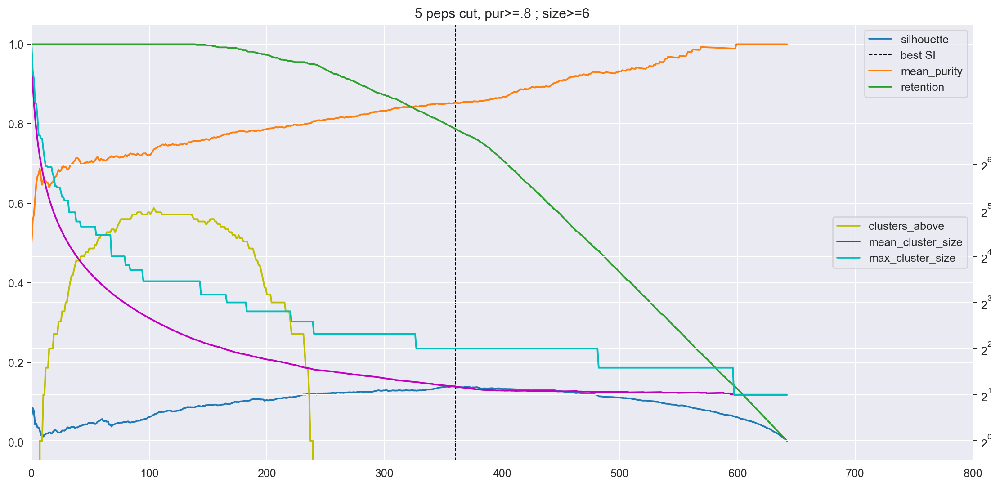

In [95]:
fig, ax = plt.subplots(1,1, figsize=(15,7))
x=range(len(micro_cut_df))
y=micro_cut_df.copy()
ax.plot(x, y['silhouette'], label='silhouette')
ax.axvline(x=y['silhouette'].idxmax(), lw=.8, ls='--', c='k', label='best SI')
ax.plot(x, y['mean_purity'], label='mean_purity')
ax.plot(x, y['retention'], label='retention')
twax = ax.twinx()
twax.set_yscale('log', base=2)
twax.set_yticks([1, 2, 4, 8, 16, 32, 64])
twax.plot(x, y['clusters_above'], label='clusters_above', c='y')
twax.plot(x, y['mean_cluster_size'], label='mean_cluster_size', c='m')
twax.plot(x, y['max_cluster_size'], label='max_cluster_size', c='c')
ax.legend(loc='upper right')
twax.legend(loc='center right')
ax.set_xlim([0,800])
twax.set_xlim([0,800])
ax.set_title('5 peps cut, pur>=.8 ; size>=6')

# size-Log2-weighted silhouette aggregation ? 

In [96]:
# Here use the new size_log2 aggregation
latent_5 = get_latent_df(ts_cstrp, test_5)
dm_5, da_5, feats_5, labels_5, encoded_labels_5, label_encoder_5 = get_distances_labels_from_latent(latent_5, index_col='raw_index')
clusters_above, micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df_sizelog2 = \
    above_cuts(dm_5, silhouette_aggregation='size_log2', min_purity=0.8, min_size=6)

Initial mean purity, silhouette score, retention
0.4994 0.0646 1.0


In [97]:
micro_cut_df_sizelog2.sort_values(['clusters_above'], ascending=False).head(50).sort_values('mean_purity',ascending=False)

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,clusters_above,max_cluster_size
136,0.0903,0.755202,1.0,4.673913,138.0,30.0,11.0
134,0.0907,0.754018,1.0,4.742647,136.0,30.0,11.0
135,0.0910,0.753415,1.0,4.708029,137.0,30.0,11.0
133,0.0915,0.752196,1.0,4.777778,135.0,30.0,11.0
130,0.0888,0.751199,1.0,4.886364,132.0,30.0,11.0
129,0.0885,0.749300,1.0,4.923664,131.0,30.0,11.0
120,0.0814,0.749112,1.0,5.286885,122.0,30.0,11.0
131,0.0895,0.749096,1.0,4.849624,133.0,30.0,11.0
114,0.0829,0.748710,1.0,5.560345,116.0,30.0,11.0
127,0.0853,0.748690,1.0,5.000000,129.0,30.0,11.0


In [98]:
micro_cut_df_sizelog2.loc[[micro_cut_df['silhouette'].idxmax()]]

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,clusters_above,max_cluster_size
360,0.1353,0.852593,0.7876,2.257778,225.0,0.0,4.0


Text(0.5, 1.0, '5 peps cut with Size-Log2-weighted silhouette')

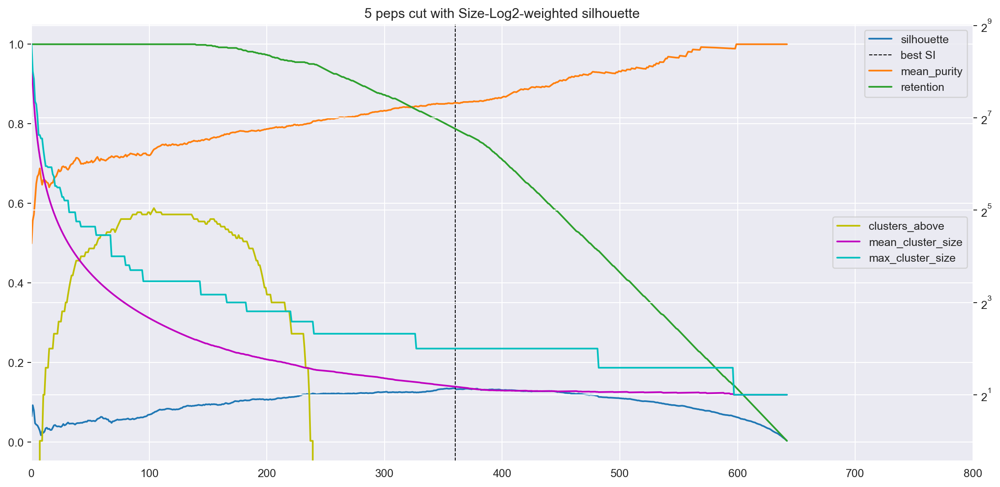

In [99]:
fig, ax = plt.subplots(1,1, figsize=(15,7))
x=range(len(micro_cut_df_sizelog2))
y=micro_cut_df_sizelog2.copy()
ax.plot(x, y['silhouette'], label='silhouette')
ax.axvline(x=y['silhouette'].idxmax(), lw=.8, ls='--', c='k', label='best SI')
ax.plot(x, y['mean_purity'], label='mean_purity')
ax.plot(x, y['retention'], label='retention')
twax = ax.twinx()
twax.set_yscale('log', base=2)
twax.plot(x, y['clusters_above'], label='clusters_above', c='y')
twax.plot(x, y['mean_cluster_size'], label='mean_cluster_size', c='m')
twax.plot(x, y['max_cluster_size'], label='max_cluster_size', c='c')
ax.legend(loc='upper right')
twax.legend(loc='center right')
ax.set_xlim([0,800])
twax.set_xlim([0,800])
ax.set_title('5 peps cut with Size-Log2-weighted silhouette')

# Normal weighetd (not log2!!)

In [100]:
# Here use the new size_log2 aggregation
latent_5 = get_latent_df(ts_cstrp, test_5)
dm_5, da_5, feats_5, labels_5, encoded_labels_5, label_encoder_5 = get_distances_labels_from_latent(latent_5, index_col='raw_index')
clusters_above, micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df_size = \
    above_cuts(dm_5, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

Initial mean purity, silhouette score, retention
0.4994 0.0655 1.0


In [101]:
micro_cut_df_sizelog2.sort_values(['clusters_above'], ascending=False).head(25).sort_values('mean_purity',ascending=False)

,silhouette,mean_purity,retention,mean_cluster_size,n_cluster,clusters_above,max_cluster_size
120,0.0814,0.749112,1.0,5.286885,122.0,30.0,11.0
122,0.0815,0.747789,1.0,5.201613,124.0,30.0,11.0
123,0.0823,0.747711,1.0,5.160000,125.0,30.0,11.0
119,0.0822,0.747563,1.0,5.330579,121.0,30.0,11.0
115,0.0838,0.746014,1.0,5.512821,117.0,30.0,11.0
125,0.0825,0.745997,1.0,5.078740,127.0,30.0,11.0
124,0.0822,0.745745,1.0,5.119048,126.0,30.0,11.0
118,0.0831,0.745628,1.0,5.375000,120.0,30.0,11.0
110,0.0811,0.745514,1.0,5.758929,112.0,31.0,11.0
109,0.0818,0.743689,1.0,5.810811,111.0,31.0,11.0


Text(0.5, 1.0, '5 peps cut with Raw-Size-weighted silhouette')

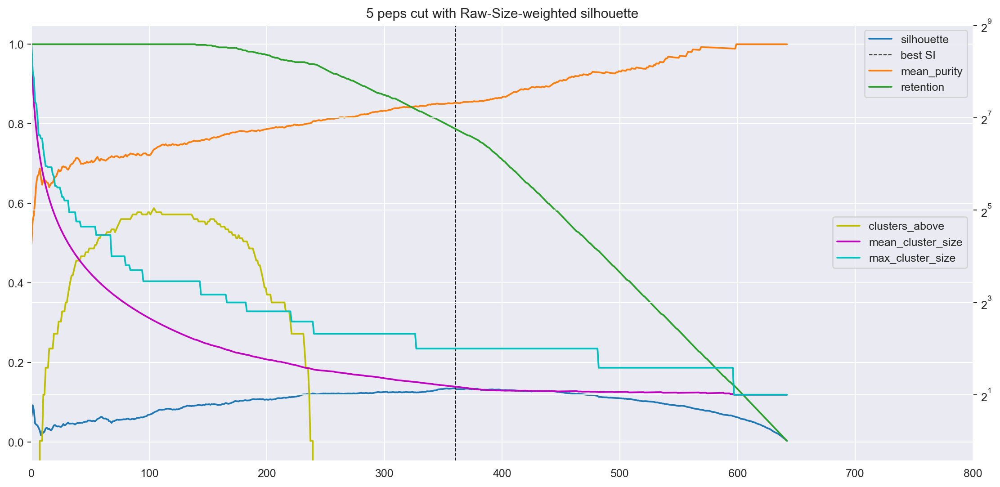

In [102]:
fig, ax = plt.subplots(1,1, figsize=(15,7))
x=range(len(micro_cut_df_size))
y=micro_cut_df_sizelog2.copy()
ax.plot(x, y['silhouette'], label='silhouette')
ax.axvline(x=y['silhouette'].idxmax(), lw=.8, ls='--', c='k', label='best SI')
ax.plot(x, y['mean_purity'], label='mean_purity')
ax.plot(x, y['retention'], label='retention')
twax = ax.twinx()
twax.set_yscale('log', base=2)
twax.plot(x, y['clusters_above'], label='clusters_above', c='y')
twax.plot(x, y['mean_cluster_size'], label='mean_cluster_size', c='m')
twax.plot(x, y['max_cluster_size'], label='max_cluster_size', c='c')
ax.legend(loc='upper right')
twax.legend(loc='center right')
ax.set_xlim([0,800])
twax.set_xlim([0,800])
ax.set_title('5 peps cut with Raw-Size-weighted silhouette')

# Altering scoring

- Check that it works properly ? The aggregation
- Check using Top 4 which has pretty good DM separation

## checks

In [103]:
from src.metrics import custom_silhouette_score

<Axes: >

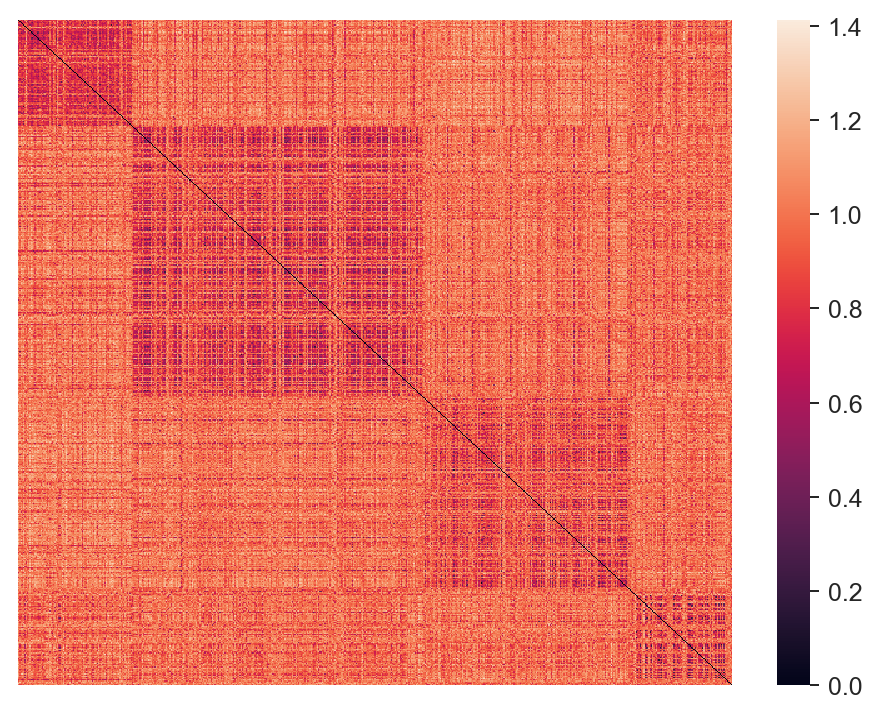

In [146]:
# latent_3 = get_latent_df(ts_cstrp, test_df.query('peptide in ["ELAGIGILTV", "GILGFVFTL", "RAKFKQLL"]')).sort_values('peptide')
latent_4 = get_latent_df(ts_cstrp, test_4).sort_values('peptide') # ELA - GIL - RAK - YLQ
dm_4, da_4, feats_4, labels_4, encoded_labels_4, label_encoder_4 = get_distances_labels_from_latent(latent_4, index_col='raw_index')
sns.heatmap(da_4, xticklabels=False, yticklabels=False)

In [147]:
silhouette_score(da_4, encoded_labels_4)

0.09713664

In [148]:
clusters_above_a, _, _, _, _, _, _, cut_df_a = above_cuts(dm_4, silhouette_aggregation='micro', min_purity=0.8, min_size=6)
clusters_above_b, _, _, _, _, _, _, cut_df_b = above_cuts(dm_4, silhouette_aggregation='macro', min_purity=0.8, min_size=6)
clusters_above_c, _, _, _, _, _, _, cut_df_c = above_cuts(dm_4, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)
clusters_above_d, _, _, _, _, _, _, cut_df_d = above_cuts(dm_4, silhouette_aggregation='size_log2', min_purity=0.8, min_size=6)

Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0825 1.0
Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0821 1.0


Text(0.5, 1.0, '4 peps cut wtf')

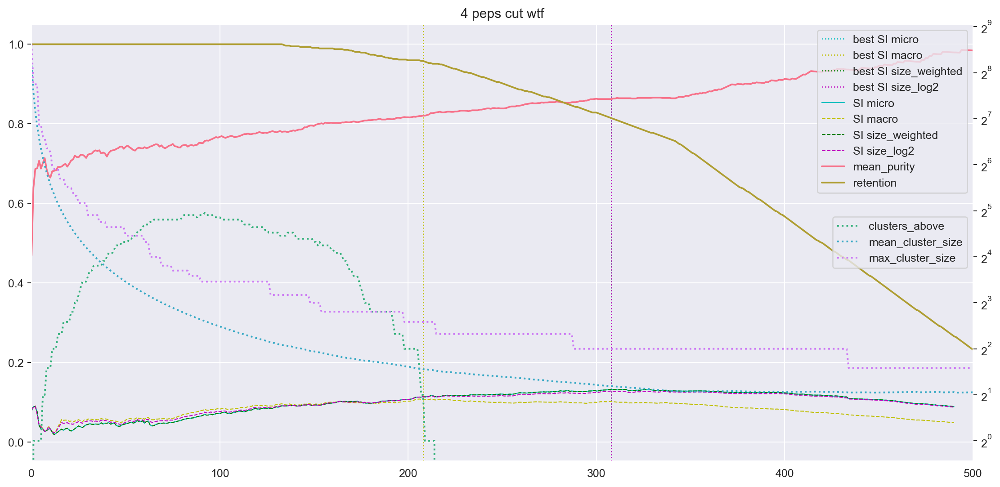

In [169]:
pal=sns.color_palette('husl', n_colors=5)

fig, ax = plt.subplots(1,1, figsize=(15,7))
x=range(len(cut_df_a))
y=cut_df_a.copy()

# silhouette_cutoff = int(2*len(dm_3)/3)
# silhouette_cutoff = int(len(dm_3)/2)
silhouette_cutoff = int(len(dm_3))

ax.axvline(x=cut_df_a.iloc[0:silhouette_cutoff]['silhouette'].idxmax(), lw=1, ls=':', c='c', label='best SI micro')
ax.axvline(x=cut_df_b.iloc[0:silhouette_cutoff]['silhouette'].idxmax(), lw=1, ls=':', c='y', label='best SI macro')
ax.axvline(x=cut_df_c.iloc[0:silhouette_cutoff]['silhouette'].idxmax(), lw=1, ls=':', c='g', label='best SI size_weighted')
ax.axvline(x=cut_df_d.iloc[0:silhouette_cutoff]['silhouette'].idxmax(), lw=1, ls=':', c='m', label='best SI size_log2')
ax.plot(x[0:silhouette_cutoff], cut_df_a.iloc[0:silhouette_cutoff]['silhouette'], ls='-', lw=.85, c='c', label='SI micro')
ax.plot(x[0:silhouette_cutoff], cut_df_b.iloc[0:silhouette_cutoff]['silhouette'], ls='--', lw=.85, c='y', label='SI macro')
ax.plot(x[0:silhouette_cutoff], cut_df_c.iloc[0:silhouette_cutoff]['silhouette'], ls='--', lw=.85, c='g', label='SI size_weighted')
ax.plot(x[0:silhouette_cutoff], cut_df_d.iloc[0:silhouette_cutoff]['silhouette'], ls='--', lw=.85, c='m', label='SI size_log2')


ax.plot(x, y['mean_purity'], label='mean_purity', c=pal[0])
ax.plot(x, y['retention'], label='retention', c=pal[1])
twax = ax.twinx()
twax.set_yscale('log', base=2)
twax.plot(x, y['clusters_above'], lw=1.55, ls=':', label='clusters_above', c=pal[2])
twax.plot(x, y['mean_cluster_size'], lw=1.55, ls=':', label='mean_cluster_size',c=pal[3])
twax.plot(x, y['max_cluster_size'], lw=1.55, ls=':', label='max_cluster_size',c=pal[4])
ax.legend(loc='upper right')
twax.legend(loc='center right')
twax.set_yticks([2**i for i in range(10)])
ax.set_xlim([0,500])
twax.set_xlim([0,500])
twax.grid(visible=False)
ax.set_title('4 peps cut wtf')

## Set iterations

In [186]:
def iterative_topn_cut_logsize_above_maxiter(dist_array, tree, max_iter, initial_cut_threshold=1, initial_cut_method='top', top_n=1, which='edge',
                                     distance_weighted=False, verbose=1, score_threshold=.75, silhouette_aggregation='micro',
                                     min_purity=0.7, min_size=6):
    # Set initial_cut_method to 'top' and initial_cut_threshold to top_n=1 to have fully iterative behaviour
    tree_cut, clusters, edges_removed, nodes_removed = betweenness_cut(tree, initial_cut_threshold, initial_cut_method,
                                                                       which, distance_weighted, verbose)
    current_silhouette_score = get_score_at_cut(dist_array, clusters, aggregation=silhouette_aggregation)
    
    print('Initial mean purity, silhouette score, retention')
    print(np.mean([x['purity'] for x in clusters]).round(4), current_silhouette_score,
          round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4))
    
    clusters_above = [[x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size]]
    scores = [current_silhouette_score]
    purities = [np.mean([x['purity'] for x in clusters])]
    retentions = [round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4)]
    mean_cluster_sizes = [np.mean([x['cluster_size'] for x in clusters])]
    all_cluster_sizes = [[x['cluster_size'] for x in clusters]]
    n_clusters = [len(clusters)]
    best_silhouette_score = -1
    # deepcopy because lists are mutable: otherwise the update in `if best_silhouette` doesn't work as intended
    best_tree, best_clusters, best_edges_removed, best_nodes_removed = tree_cut, clusters, deepcopy(edges_removed), deepcopy(nodes_removed)
    # Make a copy before starting the iteration to re-use the variable
    tree_trimmed = tree_cut.copy()
    for i in range(max_iter):
        tree_trimmed, clusters, edges_trimmed, nodes_trimmed = betweenness_cut(tree_trimmed, cut_threshold=top_n,
                                                                               cut_method='top', which=which,
                                                                               distance_weighted=distance_weighted,
                                                                               verbose=verbose)
        try:
            # print([x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size])
            current_silhouette_score = get_score_at_cut(dist_array, clusters, aggregation=silhouette_aggregation)
            scores.append(current_silhouette_score)
            purities.append(np.mean([x['purity'] for x in clusters]))
            retentions.append(round(sum([x['cluster_size'] for x in clusters]) / len(dist_array), 4))
            mean_cluster_sizes.append(np.mean([x['cluster_size'] for x in clusters]))
            all_cluster_sizes.append([x['cluster_size'] for x in clusters])
            n_clusters.append(len(clusters))
            clusters_above.append([x for x in clusters if x['purity']>=min_purity and x['cluster_size']>=min_size])
            edges_removed.extend(edges_trimmed)
            nodes_removed.extend(nodes_trimmed)
            # print(iter, current_silhouette_score, best_silhouette_score)
            # if current_silhouette_score > best_silhouette_score:
            best_silhouette_score = current_silhouette_score
            best_tree, best_clusters, best_edges_removed, best_nodes_removed = tree_trimmed, clusters, deepcopy(edges_removed), deepcopy(nodes_removed)
        except ValueError:
            # Fake an exit condition when we reach the error where we only have singletons
            current_silhouette_score = score_threshold + 1
            break

        # print(iter, np.mean([x['purity'] for x in clusters]).round(4), current_silhouette_score, round(sum([x['cluster_size'] for x in clusters])/len(dist_array),4))
        # iter += 1
    subgraphs = [nx.subgraph(best_tree, c['members']) for c in best_clusters]
    return best_tree, subgraphs, best_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, all_cluster_sizes, clusters_above

def above_cuts_maxiter(matrix, initial_cut_threshold=1, distance_weighted=True, silhouette_aggregation='micro',
                       max_iter=None, label_col='peptide', index_col='raw_index', min_purity=.7, min_size=6):
    if max_iter is None:
        max_iter = len(matrix)
    G, tree, matrix, values, labels, encoded_labels, label_encoder, raw_indices = create_mst_from_distance_matrix(matrix, label_col=label_col, index_col=index_col, algorithm='kruskal')

    best_tree, subgraphs, micro_clusters, best_edges_removed, best_nodes_removed, scores, purities, retentions, mean_cluster_sizes, n_clusters, cluster_sizes_micro, clusters_above \
        = iterative_topn_cut_logsize_above_maxiter(values, tree, max_iter, initial_cut_threshold=initial_cut_threshold, initial_cut_method='top', top_n=1, which='edge', 
                                           distance_weighted=distance_weighted, verbose=0, score_threshold=1, silhouette_aggregation=silhouette_aggregation,
                                           min_purity=min_purity, min_size=min_size)
    # df results
    micro_cut_df = pd.DataFrame(np.array([scores, purities, retentions, mean_cluster_sizes, n_clusters, 
                                          [len(x) for x in clusters_above],
                                          [max(x) for x in cluster_sizes_micro]]).T, 
                          columns=['silhouette', 'mean_purity', 'retention', 'mean_cluster_size', 'n_cluster', 'clusters_above', 'max_cluster_size'])#.assign(silhouette_aggregate='micro')
    singletons = labels[best_nodes_removed]
    
    return clusters_above, micro_clusters, best_nodes_removed, subgraphs, best_tree, labels, singletons, micro_cut_df

In [295]:
from sklearn.metrics import silhouette_score, silhouette_samples
from src.metrics import custom_silhouette_score
from src.networkx_utils import get_score_at_cut, get_pred_labels
# Do a manual cut until ~ iteration 175
# Here, it won't save the "Best" silhouette cut, but return you the cut up until the max_iter. At ~300 is the "best" silhouette
clusters_above_220, clusters_220, best_nodes_removed, subgraphs_220, best_tree_220, labels_220, singletons_220, micro_cut_df_220 = \
    above_cuts_maxiter(dm_4, max_iter=220, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

clusters_above_300, clusters_300, best_nodes_removed, subgraphs_300, best_tree_300, labels_300, singletons_300, micro_cut_df_300 = \
    above_cuts_maxiter(dm_4, max_iter=300, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

clusters_above_100, clusters_100, best_nodes_removed, subgraphs_150, best_tree_100, labels_100, singletons_100, micro_cut_df_100 = \
    above_cuts_maxiter(dm_4, max_iter=100, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

clusters_above_5, clusters_5, best_nodes_removed, subgraphs_150, best_tree_5, labels_5, singletons_5, micro_cut_df_5 = \
    above_cuts_maxiter(dm_4, max_iter=5, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

clusters_above_1, clusters_1, best_nodes_removed, subgraphs_150, best_tree_1, labels_1, singletons_1, micro_cut_df_1 = \
    above_cuts_maxiter(dm_4, max_iter=1, silhouette_aggregation='size_weighted', min_purity=0.8, min_size=6)

# Get the predicted labels (i.e. cluster numbers
pred_labels_1 = get_pred_labels(da_4, clusters_1)
pred_labels_5 = get_pred_labels(da_4, clusters_5)
pred_labels_100 = get_pred_labels(da_4, clusters_100)
pred_labels_220 = get_pred_labels(da_4, clusters_220)
pred_labels_300 = get_pred_labels(da_4, clusters_300)
# Get the Silhouette samples (no aggregation) so I can check myself. (Refer to plot to see the score between 150 and 250
samples_1 = custom_silhouette_score(da_4, pred_labels_1, aggregation='none')
samples_5 = custom_silhouette_score(da_4, pred_labels_5, aggregation='none')
samples_220 = custom_silhouette_score(da_4, pred_labels_220, aggregation='none')
samples_300 = custom_silhouette_score(da_4, pred_labels_300, aggregation='none')
samples_100 = custom_silhouette_score(da_4, pred_labels_100, aggregation='none')
samples_300.mean(), samples_220.mean(), samples_100.mean(), samples_5.mean(), samples_1.mean()


Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0798 1.0
Initial mean purity, silhouette score, retention
0.47 0.0798 1.0


(0.12870963, 0.117952846, 0.07215036, 0.03379577, 0.08970061)

### check some per cluster score ?

In [234]:
clusters_above_100[-1][8]

{'cluster_size': 8,
 'majority_label': 'ELAGIGILTV',
 'purity': 0.875,
 'counts': {'ELAGIGILTV': 7, 'YLQPRTFLL': 1},
 'members': {2, 10, 11, 15, 18, 24, 26, 566}}

In [206]:
x1=[105, 126, 214, 268, 431] # 4 gil + 1 rak
x2=[98, 178, 225, 266, 287] # fully pure gil cluster
samples_220[x1], samples_220[x2]

(array([-0.23889397,  0.20356062, -0.10696975, -0.23944277,  0.06375694],
       dtype=float32),
 array([0.2926976 , 0.4034419 , 0.11662024, 0.3086998 , 0.36054298],
       dtype=float32))

In [218]:
samples_220[x1].mean(), samples_220[x2].mean()

(-0.06359778, 0.2964005)

<Axes: >

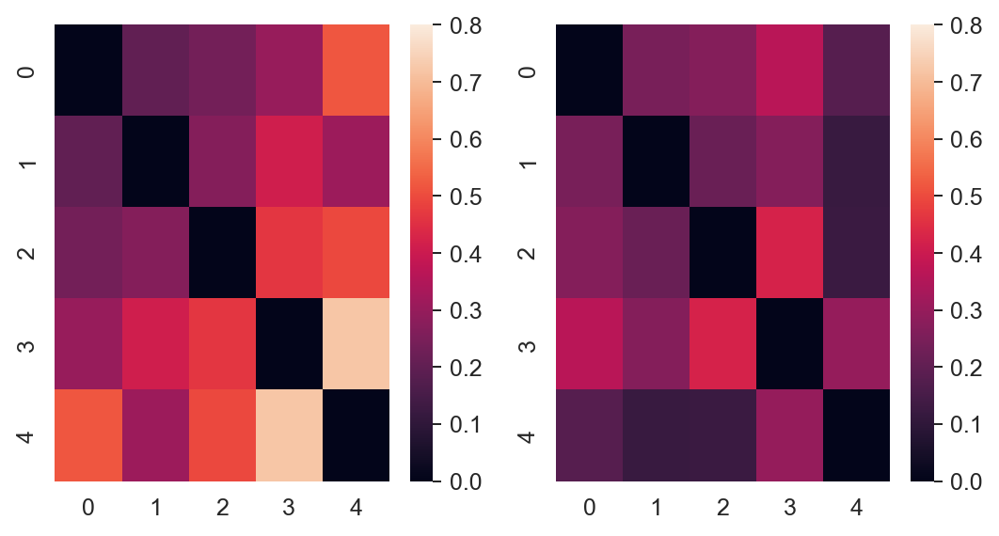

In [217]:
f,a = plt.subplots(1,2,figsize=(7,3.5))
sns.heatmap(da_4[x1][:, x1], ax=a[0], vmax=.8)
sns.heatmap(da_4[x2][:, x2], ax=a[1], vmax=.8)

In [202]:
clusters_220[:5]

[{'cluster_size': 5,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 5},
  'members': {98, 178, 225, 266, 287}},
 {'cluster_size': 5,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 5},
  'members': {101, 103, 111, 295, 318}},
 {'cluster_size': 5,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 5},
  'members': {104, 237, 247, 280, 281}},
 {'cluster_size': 5,
  'majority_label': 'GILGFVFTL',
  'purity': 0.8,
  'counts': {'GILGFVFTL': 4, 'RAKFKQLL': 1},
  'members': {105, 126, 214, 268, 431}},
 {'cluster_size': 5,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 5},
  'members': {116, 129, 196, 221, 289}}]

In [203]:
clusters_300[:5]

[{'cluster_size': 4,
  'majority_label': 'GILGFVFTL',
  'purity': 0.75,
  'counts': {'GILGFVFTL': 3, 'RAKFKQLL': 1},
  'members': {95, 307, 313, 363}},
 {'cluster_size': 4,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 4},
  'members': {98, 178, 225, 287}},
 {'cluster_size': 4,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 4},
  'members': {105, 126, 214, 268}},
 {'cluster_size': 4,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 4},
  'members': {129, 196, 221, 289}},
 {'cluster_size': 4,
  'majority_label': 'GILGFVFTL',
  'purity': 1.0,
  'counts': {'GILGFVFTL': 4},
  'members': {138, 166, 170, 275}}]

### Check aggregation ?
use : 
samples_100, samples_220, samples_300
samples_100 should have a bigger score than the others ?? somehow

In [296]:
samples_300.mean(), samples_220.mean(), samples_100.mean(), samples_5.mean(), samples_1.mean()

(0.12870963, 0.117952846, 0.07215036, 0.03379577, 0.08970061)

In [311]:
pred_labels_5

array([6, 1, 5, 5, 6, 4, 6, 1, 5, 6, 5, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5,
       5, 6, 5, 2, 5, 6, 2, 2, 5, 1, 4, 4, 5, 5, 0, 4, 6, 1, 5, 5, 5, 0,
       4, 5, 5, 6, 5, 5, 6, 3, 6, 5, 4, 5, 5, 5, 5, 5, 5, 6, 5, 4, 6, 5,
       6, 5, 5, 5, 5, 5, 0, 5, 6, 4, 5, 2, 6, 6, 5, 4, 2, 0, 5, 0, 2, 6,
       0, 6, 4, 3, 3, 1, 1, 0, 0, 1, 1, 2, 3, 0, 1, 0, 0, 1, 0, 0, 1, 3,
       6, 0, 1, 0, 0, 0, 1, 1, 2, 4, 4, 1, 1, 0, 0, 0, 1, 2, 1, 1, 3, 2,
       0, 1, 0, 1, 6, 0, 3, 1, 0, 3, 0, 5, 1, 0, 0, 1, 4, 1, 0, 0, 1, 1,
       4, 0, 1, 3, 2, 0, 5, 1, 1, 1, 2, 0, 3, 0, 2, 0, 3, 0, 1, 6, 1, 5,
       4, 1, 1, 0, 0, 3, 4, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 4, 1, 0,
       5, 0, 1, 3, 1, 0, 0, 0, 6, 0, 0, 2, 1, 0, 1, 0, 1, 0, 1, 0, 0, 6,
       1, 1, 5, 1, 3, 1, 1, 1, 0, 0, 0, 2, 0, 0, 5, 0, 0, 0, 0, 1, 4, 1,
       1, 0, 1, 0, 0, 0, 0, 2, 0, 0, 1, 6, 1, 0, 0, 0, 2, 3, 1, 3, 0, 1,
       0, 0, 1, 3, 1, 1, 4, 1, 0, 0, 4, 3, 3, 0, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 3, 1, 1, 0, 1, 0, 6, 0, 5, 0, 3,

In [316]:

for label in np.unique(pred_labels_5):
    print(samples_5[np.where(pred_labels_5==label)[0]].mean())
    

-0.013315371
0.041833892
0.057749268
-0.028266776
0.069504976
0.09591357
0.055826064


In [320]:
np.unique(pred_labels_1, return_counts=True)

(array([0, 1, 2], dtype=int16), array([215, 178, 178]))

In [321]:
clusters_1

[{'cluster_size': 215,
  'majority_label': 'GILGFVFTL',
  'purity': 0.8,
  'counts': {'ELAGIGILTV': 10,
   'GILGFVFTL': 172,
   'RAKFKQLL': 20,
   'YLQPRTFLL': 13},
  'members': {1,
   7,
   31,
   36,
   39,
   43,
   72,
   83,
   85,
   88,
   93,
   94,
   95,
   96,
   97,
   98,
   101,
   102,
   103,
   104,
   105,
   106,
   107,
   108,
   111,
   112,
   113,
   114,
   115,
   116,
   117,
   121,
   122,
   123,
   124,
   125,
   126,
   128,
   129,
   132,
   133,
   134,
   135,
   137,
   139,
   140,
   142,
   144,
   145,
   146,
   147,
   149,
   150,
   151,
   152,
   153,
   155,
   156,
   159,
   161,
   162,
   163,
   165,
   167,
   169,
   171,
   172,
   174,
   177,
   178,
   179,
   180,
   183,
   184,
   185,
   186,
   187,
   188,
   189,
   190,
   191,
   192,
   193,
   194,
   196,
   197,
   199,
   200,
   202,
   203,
   204,
   205,
   207,
   208,
   210,
   211,
   212,
   213,
   214,
   215,
   216,
   217,
   218,
   220,
   221,
  

In [317]:

for label in np.unique(pred_labels_1):
    print(samples_1[np.where(pred_labels_1==label)[0]].mean())
    

0.12873855
0.0696954
0.062553264


In [314]:
np.log2(np.unique(pred_labels_5, return_counts=True)[1])

array([6.87036472, 6.61470984, 6.5849625 , 6.357552  , 6.28540222,
       5.97727992, 5.20945337])

In [308]:
def agg_sum(samples, labels, log=True):
    unique_labels, weights = np.unique(labels, return_counts=True)
    if log:
        weights = np.log2(weights)
    score = 0
    for label in unique_labels:
        score += np.sum(samples[np.where(labels==label)[0]] * weights[label]) / len(weights)
        
    return round(score,4), round(score/weights.sum(),4), round(score/(weights.sum()/np.max(weights)), 4), round(score/(np.mean(weights)), 4)

print('1 Log (raw, divided)\t', agg_sum(samples_1, pred_labels_1))
print('5 Log (raw, divided)\t', agg_sum(samples_5, pred_labels_5))
print('100 Log (raw, divided)\t', agg_sum(samples_100, pred_labels_100))
print('220 Log (raw, divided)\t', agg_sum(samples_220, pred_labels_220))
print('300 Log (raw, divided)\t', agg_sum(samples_300, pred_labels_300))
print('-'*50)
print('1 (raw, divided)\t', agg_sum(samples_1, pred_labels_1, False))
print('5 (raw, divided)\t', agg_sum(samples_5, pred_labels_5, False))
print('100 (raw, divided)\t', agg_sum(samples_100, pred_labels_100, False))
print('220 (raw, divided)\t', agg_sum(samples_220, pred_labels_220, False))
print('300 (raw, divided)\t', agg_sum(samples_300, pred_labels_300, False))

1 Log (raw, divided)	 (130.1471, 5.7334, 44.4238, 17.2003)
5 Log (raw, divided)	 (17.02, 0.3877, 2.6636, 2.7139)
100 Log (raw, divided)	 (0.9935, 0.0041, 0.0143, 0.4218)
220 Log (raw, divided)	 (0.4773, 0.0017, 0.004, 0.3865)
300 Log (raw, divided)	 (0.3234, 0.0013, 0.0027, 0.4061)
--------------------------------------------------
1 (raw, divided)	 (3380.3684, 5.9201, 1272.8182, 17.7603)
5 (raw, divided)	 (205.9465, 0.3607, 42.1992, 2.5247)
100 (raw, divided)	 (2.4777, 0.0043, 0.0477, 0.4426)
220 (raw, divided)	 (0.9522, 0.0017, 0.0083, 0.3702)
300 (raw, divided)	 (0.6353, 0.0011, 0.0045, 0.336)


In [258]:
labels = pred_labels_100.copy()
samples = samples_100.copy()

unique_labels, label_counts = np.unique(labels, return_counts=True)
label_logcounts = np.log2(label_counts)
score = 0
for label in unique_labels:
    score += np.sum(samples[np.where(labels==label)[0]] * label_logcounts[label])
print(score, score/label_logcounts.sum())

101.33441261202097 0.42179488231360146


## Other synthetic data?

In [110]:
#manual assessment
def generate_fake_labels_per_class(class_size, large_clusters=2, medium_cluster=1):
    labels = []
    
    # Step 1: Generate large clusters (size between 12 and 20)
    large_cluster_sizes = np.random.randint(12, 21, size=large_clusters)
    
    # Check if the total large cluster size exceeds class size
    while np.sum(large_cluster_sizes) > class_size - 7:  # Leave room for medium and small clusters
        large_cluster_sizes = np.random.randint(12, 21, size=large_clusters)
    
    large_cluster_labels = np.repeat(np.arange(large_clusters), large_cluster_sizes)
    
    # Step 2: Generate medium cluster (size between 5 and 7)
    medium_cluster_size = np.random.randint(5, 8, size=medium_cluster)
    
    # Check remaining size for small clusters
    remaining_size = class_size - (np.sum(large_cluster_sizes) + np.sum(medium_cluster_size))
    
    # Step 3: Generate small clusters (size 1 or 2)
    small_cluster_labels = []
    if remaining_size > 0:
        small_cluster_sizes = []
        
        # Create small clusters that exactly fill the remaining space
        while remaining_size > 0:
            small_size = min(remaining_size, np.random.choice([1, 2], p=[0.6, 0.4]))  # More 1-sized clusters
            small_cluster_sizes.append(small_size)
            remaining_size -= small_size

        small_cluster_labels = np.repeat(np.arange(large_clusters + medium_cluster, 
                                                   large_clusters + medium_cluster + len(small_cluster_sizes)), 
                                         small_cluster_sizes)

    # Combine large, medium, and small cluster labels
    labels.extend(large_cluster_labels)
    labels.extend(np.repeat(large_clusters, medium_cluster_size))  # Medium cluster label
    labels.extend(small_cluster_labels)

    # Shuffle the labels to avoid ordered clusters
    np.random.shuffle(labels)
    
    return np.array(labels)

# Generate fake labels for each class
encoded_labels_5_sizes = np.bincount(encoded_labels_5)
fake_labels = []

for size in encoded_labels_5_sizes:
    fake_labels_class = generate_fake_labels_per_class(size)
    fake_labels.append(fake_labels_class)

# Concatenate all classes into one array of labels
final_labels = np.concatenate([cls + i * 100 for i, cls in enumerate(fake_labels)])  # Offset class labels by 100 to avoid overlaps

# Check the size matches your dataset
assert len(final_labels) == np.sum(encoded_labels_5_sizes), "Final label size does not match the dataset size!"

# Output the final labels
print(len(final_labels))


fake_labels = np.random.choice(range(50), size=len(da_5))

645


In [118]:
unique_labels, cluster_sizes = np.unique(encoded_labels_3, return_counts=True)
unique_labels, cluster_sizes

(array([0, 1, 2]), array([ 92, 233, 166]))

In [120]:

weighted_silhouette_score(da_5, fake_labels, metric='precomputed')

-0.10827530917460321

In [121]:
print(custom_silhouette_score(da_5, fake_labels, aggregation='micro'))
print(custom_silhouette_score(da_5, final_labels, aggregation='micro'))


-0.1085684
-0.3250096


In [122]:
print(custom_silhouette_score(da_5, fake_labels, aggregation='micro'))
print(custom_silhouette_score(da_5, fake_labels, aggregation='macro'))
print(custom_silhouette_score(da_5, fake_labels, aggregation='size_weighted'))
print(custom_silhouette_score(da_5, fake_labels, aggregation='size_log2'))

print(custom_silhouette_score(da_5, final_labels, aggregation='micro'))
print(custom_silhouette_score(da_5, final_labels, aggregation='macro'))
print(custom_silhouette_score(da_5, final_labels, aggregation='size_weighted'))
print(custom_silhouette_score(da_5, final_labels, aggregation='size_log2'))

-0.1085684
-0.10891047
-0.10856840782618338
-0.10879890149706488
-0.3250096
-0.19595742
-0.3250096001597338
-0.2906834540099046


# Altering cuts

## Check different kinds of centrality

## Rank clusters based on intra mean/med/max distance and cluster avg silhouette score ?